## Flood based image retrieval system

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing necessary libraries

In [3]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import  Model
from scipy.spatial import distance
from PIL import Image
from skimage import feature
import pickle
import numpy as np
import math
import os
import matplotlib.pyplot as plt
import matplotlib
import cv2 as cv
import time

import tensorflow as tf
import cv2
from tensorflow.keras.applications import VGG16
from sklearn.preprocessing import normalize
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances, euclidean_distances
from tensorflow.keras.applications import ResNet50

## 1) ColorH2gram model

In [ ]:
def colorH2gram(pathfilename):
    img = cv.imread(pathfilename,cv.IMREAD_COLOR)
    img = cv.cvtColor(img,cv.COLOR_BGR2HSV)
    H, S, V = img[:,:,0], img[:,:,1], img[:,:,2]
    hist_h = cv.calcHist([H],[0],None,[256],[0,256])
    hist_s = cv.calcHist([S],[0],None,[256],[0,256])
    hist_v = cv.calcHist([V],[0],None,[256],[0,256])
    features = np.concatenate([hist_h,hist_s,hist_v])
    return features

def HoG(path_img):
    img = cv.imread(path_img)
    img = cv.resize(img, (75, 100))
    (hog, hog_image) = feature.hog(img, orientations=9, pixels_per_cell=(8, 8),
                                   cells_per_block=(2, 2), block_norm='L2-Hys',
                                   visualize=True, transform_sqrt=True)
    return hog

def processing(path, query_h2g ,mode = 0, verbose=0): # 0: h2g | 1: HoG
    results = []

    for item in os.listdir(path):
        if item == path.split('/')[-1]: # Remove query image
            continue
        if verbose != 0:
            print(f'Processing {item}')
        if mode == 0:
            data_h2g = colorH2gram(os.path.join(path,item))
        elif mode == 1:
            data_h2g = HoG(os.path.join(path,item))
        dist = 1 - distance.cosine(query_h2g, data_h2g)
        results.append([os.path.join(path,item), dist])

    results = np.array(results)
    return results

### Using color histogram

Query Image

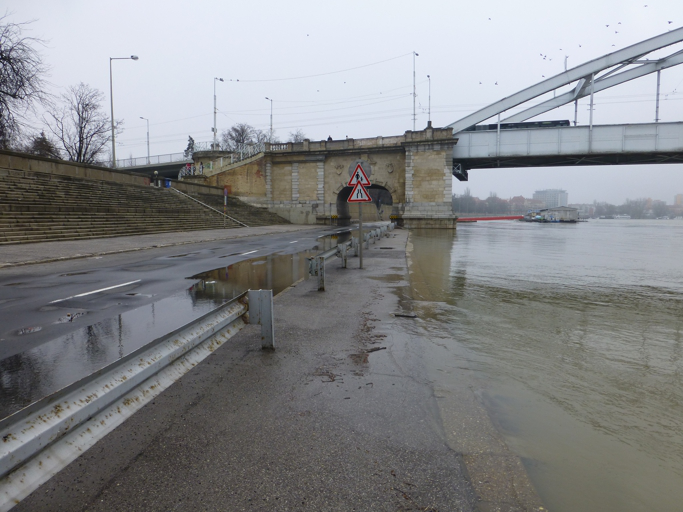

In [ ]:
img_query = 'C:/Users/HP/image-retrieval-main/static/dataset/img/25441112.jpg'
Image.open(img_query)

In [ ]:
path = 'C:/Users/HP/image-retrieval-main/static/dataset/img'
start = time.time()
query_h2g = colorH2gram(img_query)
results = processing(path,query_h2g ,0)
print(f'Time used: {time.time()-start}s')

Time used: 44.15401864051819s


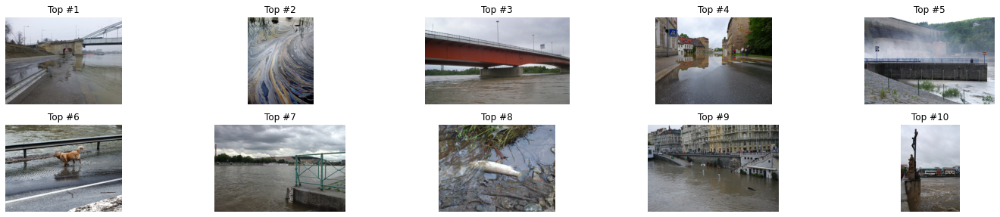

In [ ]:
K = 10 # Return top K image same as query image
results = sorted(results, key=lambda x: x[1],reverse=True)

axes = []
grid_size = int(math.sqrt(K))
fig = plt.figure(figsize=(20,10))


for id in range(K):
    draw_image = results[id]
    axes.append(fig.add_subplot(5, 5, id+1))
    axes[-1].set_title(f'Top #{id+1}')
    plt.axis('off')
    plt.imshow(Image.open(draw_image[0]))

fig.tight_layout()
plt.show()

##2) RESnet model

In [ ]:
base_model2 = ResNet50(weights='imagenet', include_top=False, pooling='avg')

In [ ]:
query_image_path = '/content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441112.jpg'
query_image = load_img(query_image_path, target_size=(224, 224))
query_image = img_to_array(query_image)
query_image = preprocess_input(query_image)
query_image = np.expand_dims(query_image, axis=0)
query_features2 = base_model2.predict(query_image)

1/1 [==============================] - 1s 862ms/step


In [ ]:
final_query_features = np.array(query_features2[0][:512])

In [ ]:
#  Calculate cosine similarity between the query image and database images
similarities = cosine_similarity(final_query_features.flatten().reshape(1, -1), np.array(database_features).reshape(len(database_features), -1))

Top 1 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26503046.jpg (Similarity: 0.4330)
Top 2 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26503042.jpg (Similarity: 0.3915)
Top 3 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26554673.jpg (Similarity: 0.3859)
Top 4 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26556187.jpg (Similarity: 0.3828)
Top 5 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/53245148.jpg (Similarity: 0.3797)
Top 6 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26546060.jpg (Similarity: 0.3779)
Top 7 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26536561.jpg (Similarity: 0.3753)
Top 8 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/56492364.jpg (Similarity: 0.3748)
Top 9 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26514466.jpg (Similarity: 0.3747)
Top 10 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26504225.jpg (Similarit

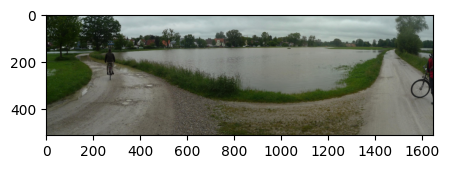

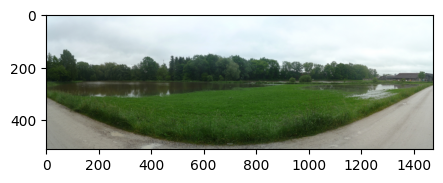

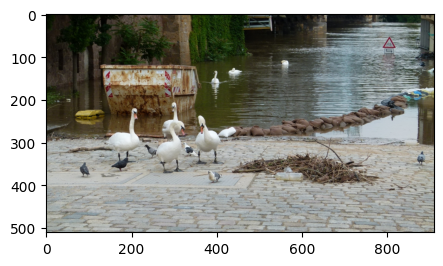

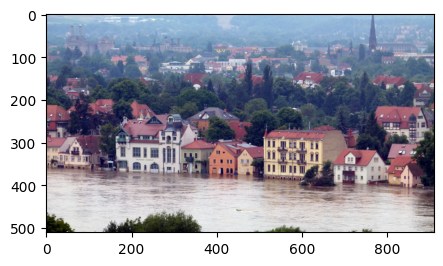

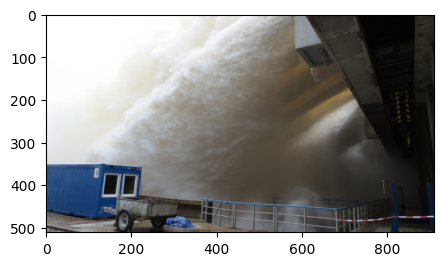

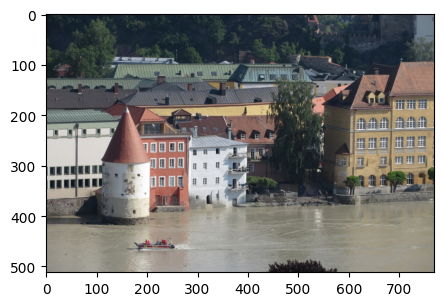

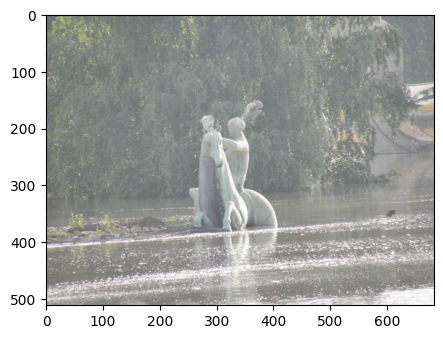

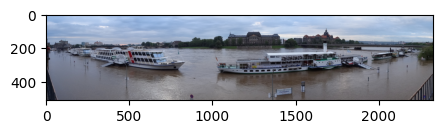

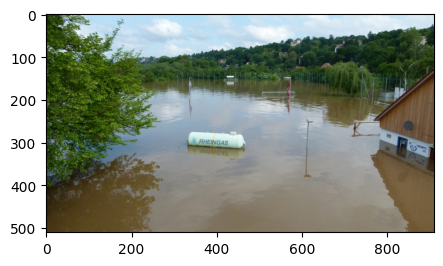

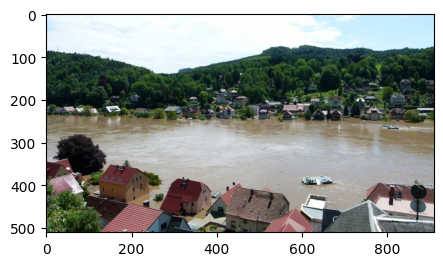

In [ ]:
# Sort the database images by similarity
sorted_indices = np.argsort(similarities, axis=1)[:, ::-1]

# Display the top 10 most similar images
top_10_indices = sorted_indices[0, :10]

for i, index in enumerate(top_10_indices):
    print(f"Top {i+1} Image: {image_paths[index]} (Similarity: {similarities[0, index]:.4f})")
    fig = plt.figure(figsize=(5,5))
    plt.imshow(Image.open(image_paths[index]))

Enter the indices of relevant images (comma-separated): 1,3,4,5,6,7,8,9,10

Updated Top 10 Images After Relevance Feedback:
Top 1 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26492201.jpg (Similarity: 0.8206)
Top 2 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26490666.jpg (Similarity: 0.8101)
Top 3 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26639920.jpg (Similarity: 0.8031)
Top 4 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26490197.jpg (Similarity: 0.7999)
Top 5 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26817881.jpg (Similarity: 0.7969)
Top 6 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26554954.jpg (Similarity: 0.7897)
Top 7 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26544518.jpg (Similarity: 0.7895)
Top 8 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26460121.jpg (Similarity: 0.7870)
Top 9 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/2

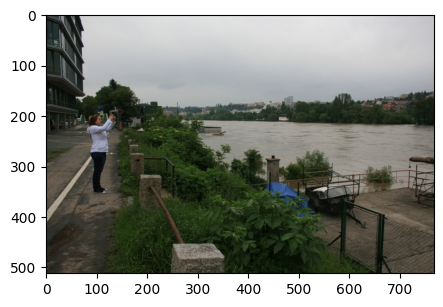

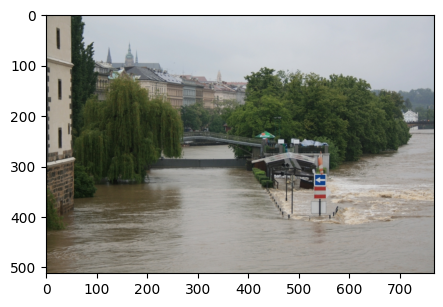

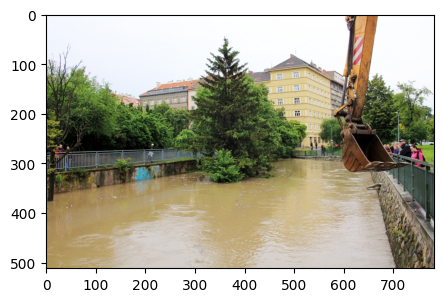

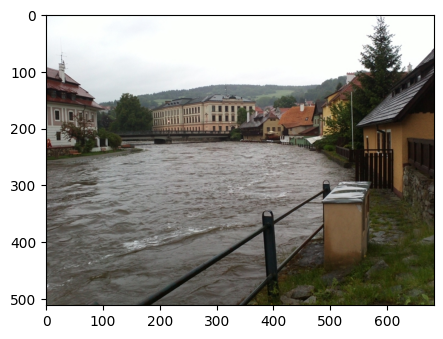

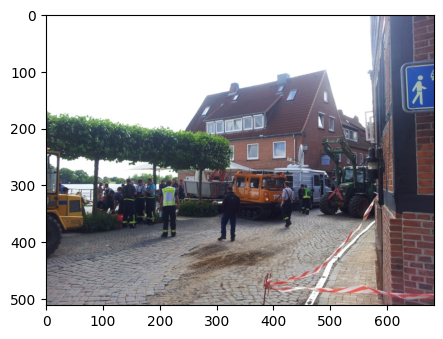

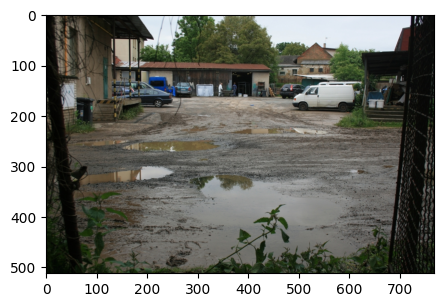

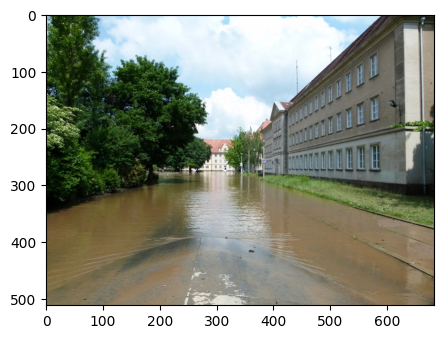

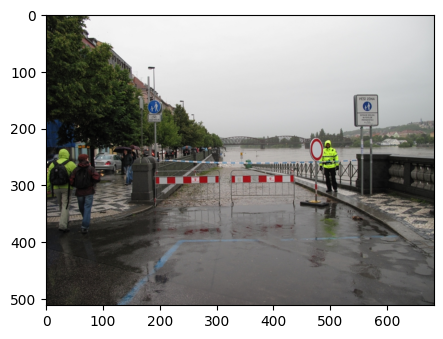

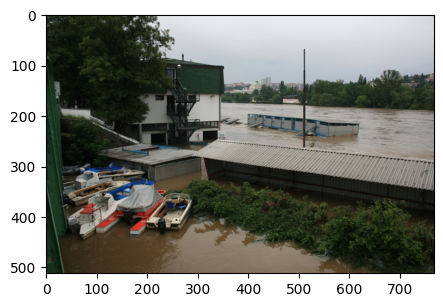

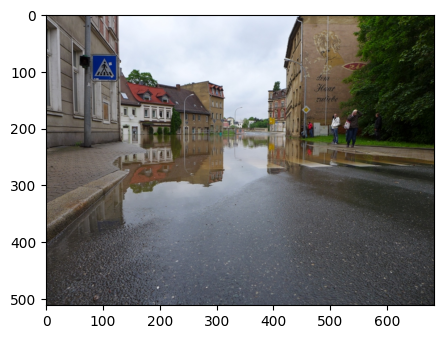

In [ ]:
# Relevance Feedback
feedback_indices = input("Enter the indices of relevant images (comma-separated): ")
feedback_indices = [int(idx) for idx in feedback_indices.split(',')]

# Adjust the query based on feedback
relevant_features = [database_features[i] for i in feedback_indices]
new_query_features = np.mean(relevant_features, axis=0)

new_similarities = cosine_similarity(new_query_features.flatten().reshape(1, -1), np.array(database_features).reshape(len(database_features), -1))

new_sorted_indices = np.argsort(new_similarities, axis=1)[:, ::-1]
new_top_10_indices = new_sorted_indices[0, :10]

print("\nUpdated Top 10 Images After Relevance Feedback:")
for i, index in enumerate(new_top_10_indices):
    print(f"Top {i+1} Image: {image_paths[index]} (Similarity: {new_similarities[0, index]:.4f})")
    fig = plt.figure(figsize=(5,5))
    plt.imshow(Image.open(image_paths[index]))

## 3) VGG16 model

In [ ]:
# Model Defining
def get_extract_model():
    vgg16_model = VGG16(weights="imagenet")
    extract_model = Model(inputs=vgg16_model.inputs, outputs = vgg16_model.get_layer("fc1").output)
    return extract_model

# Image Preprocessing, image to tensor
def image_preprocess(img):
    img = img.resize((224,224)) # VGG16 constraint
    img = img.convert("RGB")
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

def extract_vector(model, image_path, verbose=0):
    if verbose != 0:
        print("Extracting: ", image_path)
    img = Image.open(image_path)
    img_tensor = image_preprocess(img)
    vector = model.predict(img_tensor)[0]
    vector = vector / np.linalg.norm(vector)
    return vector

In [ ]:
# Model initialization
model = get_extract_model()

data_path = 'C:/Users/HP/image-retrieval-main/static/dataset/img/'

vectors, paths = [], []

for image_path in os.listdir('C:/Users/HP/image-retrieval-main/static/dataset/img/'):
    image_path_full = os.path.join(data_path, image_path)
    image_vector = extract_vector(model,image_path_full)
    vectors.append(image_vector)
    paths.append(image_path_full)

# Save feature's file
vector_file = "C:/Users/HP/image-retrieval-main/static/vectors.pkl"
path_file = "C:/Users/HP/image-retrieval-main/static/paths.pkl"

pickle.dump(vectors, open(vector_file, "wb"))
pickle.dump(paths, open(path_file, "wb"))

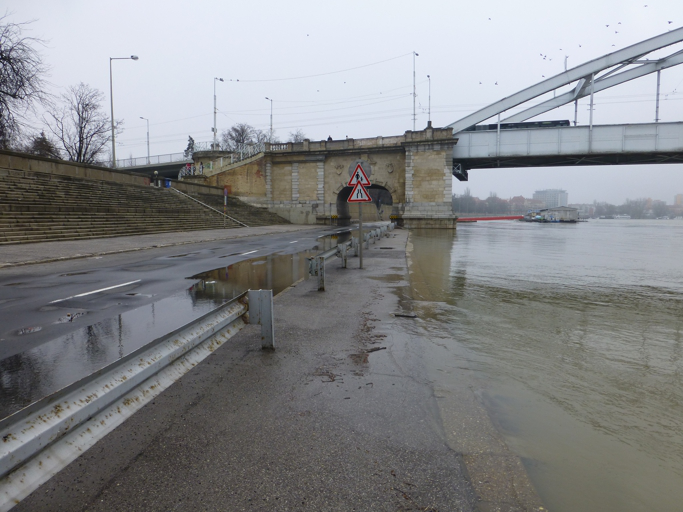

In [ ]:
img_query = 'C:/Users/HP/image-retrieval-main/static/dataset/img/25441112.jpg'
Image.open(img_query)

# VGG16 with relevance feedback

In [ ]:
# Load the pre-trained VGG16 model
base_model = VGG16(weights='imagenet', include_top=False, pooling='avg')

# Load and preprocess the query image
query_image_path = '/content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441112.jpg'
query_image = load_img(query_image_path, target_size=(224, 224))
query_image = img_to_array(query_image)
query_image = preprocess_input(query_image)
query_image = np.expand_dims(query_image, axis=0)
query_features = base_model.predict(query_image)

58889256/58889256 [==============================] - 0s 0us/step


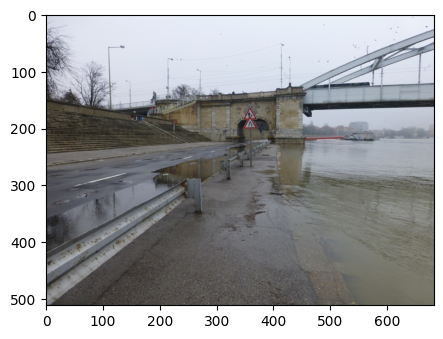

In [ ]:
fig = plt.figure(figsize=(5,5))
plt.imshow(Image.open("/content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441112.jpg"))

In [ ]:
image_paths = []
img_dir = "/content/drive/MyDrive/sem-9/IR/IR package/imgs_small"
for images in os.listdir(img_dir):
  # print(img_dir + "/" + images)
  image_paths.append(img_dir + "/" + images)

In [ ]:
database_features = []
for image_path in image_paths:
    img = load_img(image_path, target_size=(224, 224))
    img = img_to_array(img)
    img = preprocess_input(img)
    img = np.expand_dims(img, axis=0)
    features = base_model.predict(img)
    database_features.append(features)

1/1 [==============================] - 0s 30ms/step


In [ ]:
# Save feature's file
database_features_file = "/content/drive/MyDrive/sem-9/IR/IR package/database_features.pkl"
image_paths_file = "/content/drive/MyDrive/sem-9/IR/IR package/image_paths.pkl"

pickle.dump(database_features, open(database_features_file, "wb"))
pickle.dump(image_paths, open(image_paths_file, "wb"))

In [ ]:
database_features = pickle.load(open("/content/drive/MyDrive/sem-9/IR/IR package/database_features.pkl","rb"))
image_paths = pickle.load(open("/content/drive/MyDrive/sem-9/IR/IR package/image_paths.pkl","rb"))

In [ ]:
#  Calculate cosine similarity between the query image and database images
similarities = cosine_similarity(query_features.flatten().reshape(1, -1), np.array(database_features).reshape(len(database_features), -1))

Top 1 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441112.jpg (Similarity: 1.0000)
Top 2 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441113.jpg (Similarity: 0.7914)
Top 3 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/25441114.jpg (Similarity: 0.7759)
Top 4 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26533842.jpg (Similarity: 0.7636)
Top 5 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26538997.jpg (Similarity: 0.7619)
Top 6 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26468796.jpg (Similarity: 0.7476)
Top 7 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/29872678.jpg (Similarity: 0.7392)
Top 8 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26570555.jpg (Similarity: 0.7378)
Top 9 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26470908.jpg (Similarity: 0.7347)
Top 10 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26578041.jpg (Similarit

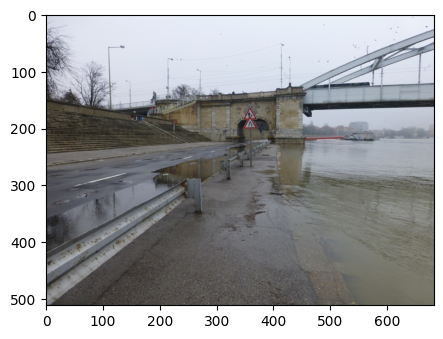

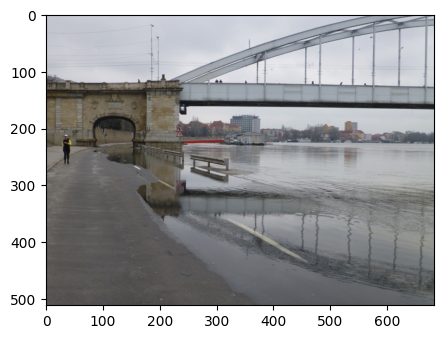

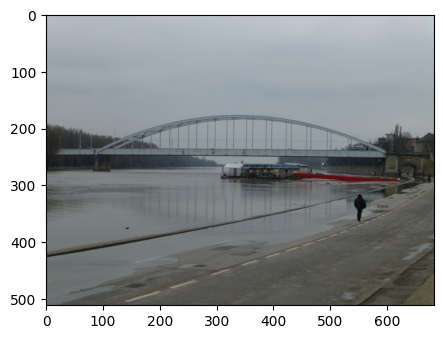

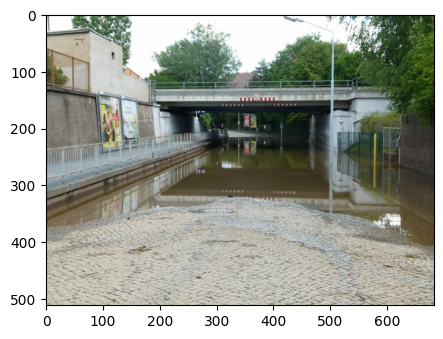

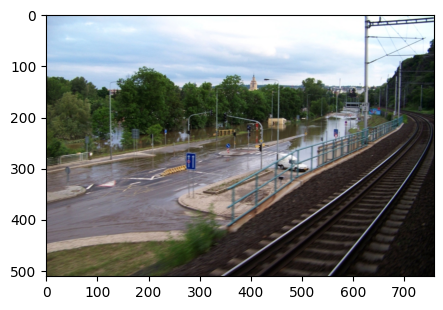

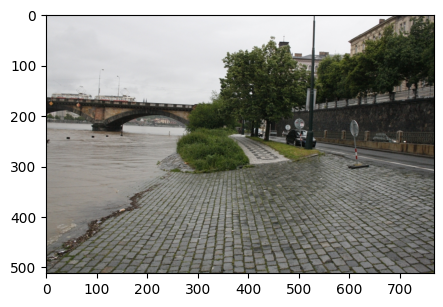

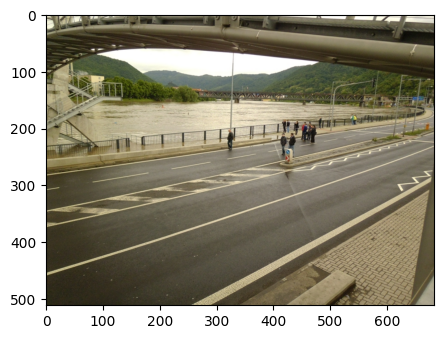

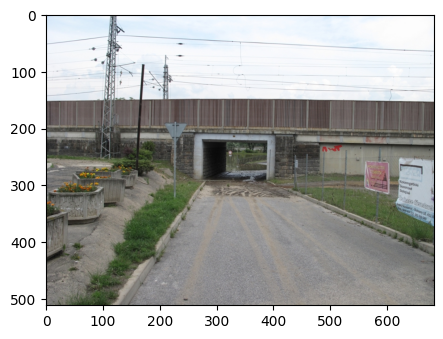

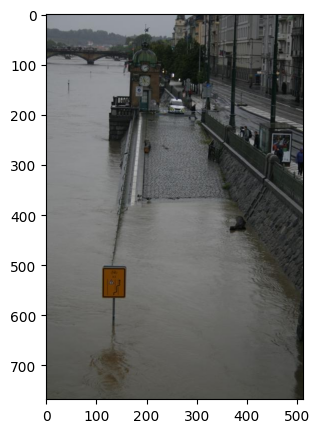

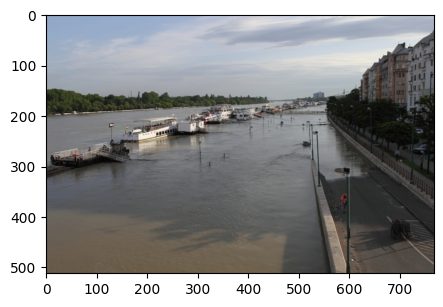

In [ ]:
# Sort the database images by similarity
sorted_indices = np.argsort(similarities, axis=1)[:, ::-1]

# Display the top 10 most similar images
top_10_indices = sorted_indices[0, :10]

for i, index in enumerate(top_10_indices):
    print(f"Top {i+1} Image: {image_paths[index]} (Similarity: {similarities[0, index]:.4f})")
    fig = plt.figure(figsize=(5,5))
    plt.imshow(Image.open(image_paths[index]))

Enter the indices of relevant images (comma-separated): 1,2,3,4,5,6,7,9,10

Updated Top 10 Images After Relevance Feedback:
Top 1 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26639920.jpg (Similarity: 0.8587)
Top 2 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26492201.jpg (Similarity: 0.8566)
Top 3 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26490197.jpg (Similarity: 0.8339)
Top 4 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26504214.jpg (Similarity: 0.8266)
Top 5 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/33161489.jpg (Similarity: 0.8189)
Top 6 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26490666.jpg (Similarity: 0.8185)
Top 7 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26514423.jpg (Similarity: 0.8161)
Top 8 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/26451520.jpg (Similarity: 0.8121)
Top 9 Image: /content/drive/MyDrive/sem-9/IR/IR package/imgs_small/2

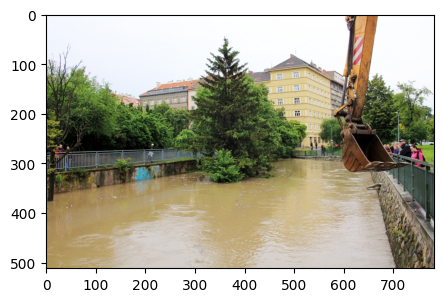

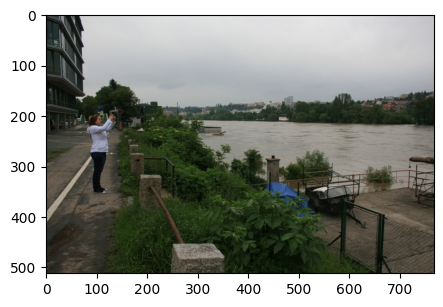

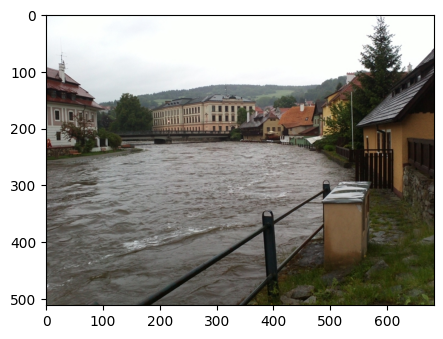

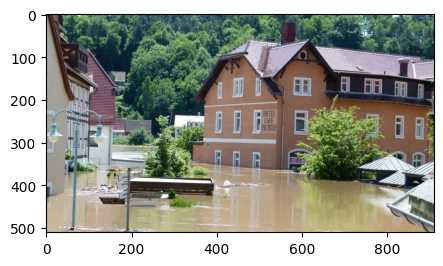

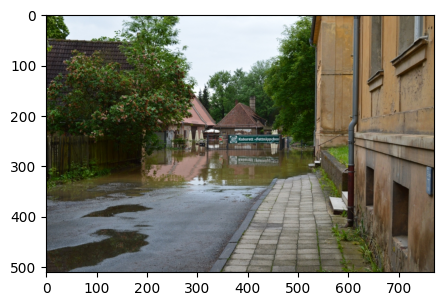

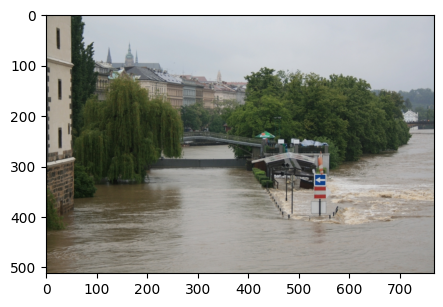

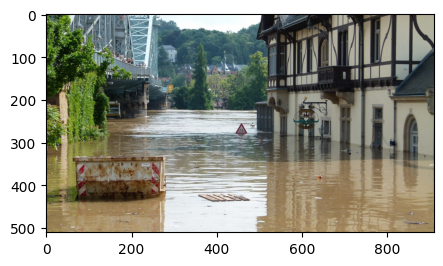

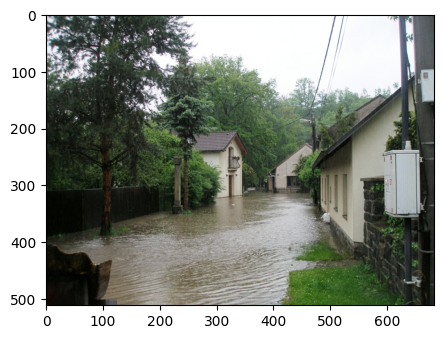

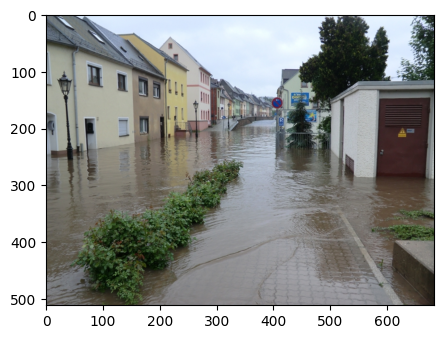

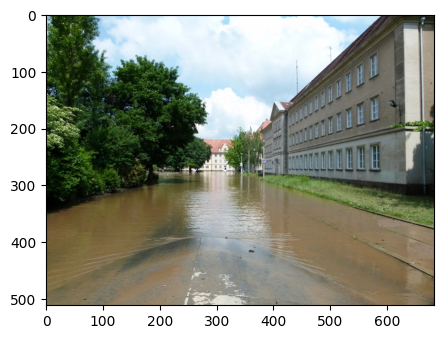

In [ ]:
# Relevance Feedback
feedback_indices = input("Enter the indices of relevant images (comma-separated): ")
feedback_indices = [int(idx) for idx in feedback_indices.split(',')]

# Adjust the query based on feedback
relevant_features = [database_features[i] for i in feedback_indices]
new_query_features = np.mean(relevant_features, axis=0)

# Calculate new similarities
new_similarities = cosine_similarity(new_query_features.flatten().reshape(1, -1), np.array(database_features).reshape(len(database_features), -1))

# Sort and display updated top 10 images
new_sorted_indices = np.argsort(new_similarities, axis=1)[:, ::-1]
new_top_10_indices = new_sorted_indices[0, :10]

print("\nUpdated Top 10 Images After Relevance Feedback:")
for i, index in enumerate(new_top_10_indices):
    print(f"Top {i+1} Image: {image_paths[index]} (Similarity: {new_similarities[0, index]:.4f})")
    fig = plt.figure(figsize=(5,5))
    plt.imshow(Image.open(image_paths[index]))

## VGG16 model gives the best reults

Save to drive for further purposes

In [ ]:
!cp /content/paths.pkl /content/drive/MyDrive/CS336.M12.KHCL/results
!cp /content/vectors.pkl /content/drive/MyDrive/CS336.M12.KHCL/results

In [ ]:
query_features2

array([[0.1414014 , 0.0834274 , 0.22846769, ..., 0.72158736, 0.05406456,
        0.15445499]], dtype=float32)

In [ ]:
len(final_query_features)

512

In [ ]:
len(database_features[0][0])

512

In [ ]:
# database_features = pickle.load(open("/content/drive/MyDrive/sem-9/IR/IR package/database_features.pkl","rb"))
# image_paths = pickle.load(open("/content/drive/MyDrive/sem-9/IR/IR package/image_paths.pkl","rb"))

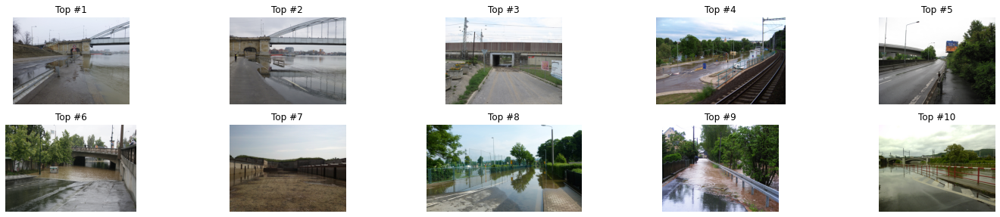

In [ ]:
# Query image features extraction
search_vector = extract_vector(model, img_query)

vectors = pickle.load(open("C:/Users/HP/image-retrieval-main/static/vectors.pkl","rb"))
paths = pickle.load(open("C:/Users/HP/image-retrieval-main/static/paths.pkl","rb"))

# Distance from query's vector to all vector in dataset
distance = np.linalg.norm(vectors - search_vector, axis=1)

K = 10 # Return top K image same as query image
ids = np.argsort(distance)[:K]

nearest_image = [(paths[id], distance[id]) for id in ids]

axes = []
grid_size = int(math.sqrt(K))
fig = plt.figure(figsize=(20,10))


for id in range(K):
    draw_image = nearest_image[id]
    # axes.append(fig.add_subplot(grid_size, grid_size, id+1))
    axes.append(fig.add_subplot(5, 5, id+1))


    # axes[-1].set_title(draw_image[1])
    # axes[-1].set_title(draw_image[0].split('/')[-1] + f' ({draw_image[1]})')
    axes[-1].set_title(f'Top #{id+1}')

    plt.axis('off')
    plt.imshow(Image.open(draw_image[0]))

fig.tight_layout()
plt.show()